In [1]:
import numpy as np
import librosa as libr
import librosa.display as disp
import os
import random
from IPython.display import Audio

In [2]:
from scipy.io import wavfile
from pesq import pesq

In [3]:
import warnings
warnings.filterwarnings('ignore')

In [4]:
import matplotlib.pyplot as plt
%matplotlib inline

## Noisy Audio

In [74]:
train_data_path = './../data/28/noisy_trainset_28spk_wav'

In [75]:
file_list = os.listdir(train_data_path)
random_file = random.choice(file_list)
sample_file_path = os.path.join(train_data_path, random_file)
sample_file_path

'./../data/28/noisy_trainset_28spk_wav/p250_342.wav'

In [7]:
signal, sample_rate = libr.load(str(sample_file_path)) #sr=22050
signal

array([ 0.01792993,  0.04822795,  0.05329101, ..., -0.0999655 ,
       -0.11121187, -0.08120465], dtype=float32)

In [8]:
fig_size = (10,6)

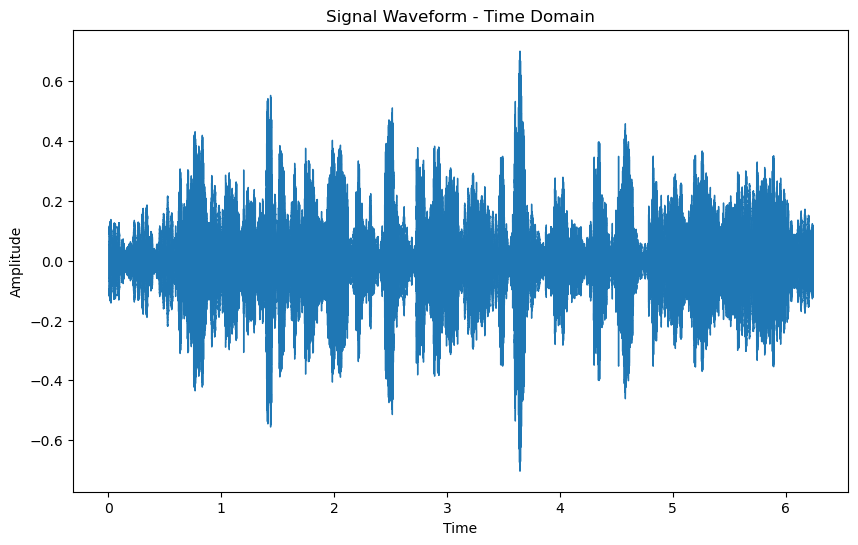

In [9]:
plt.figure(figsize=fig_size)
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.title("Signal Waveform - Time Domain")

disp.waveshow(signal,sr=sample_rate)
Audio(sample_file_path)

In [10]:
fft = np.fft.fft(signal)
magnitude = np.abs(fft)
frequency =np.linspace(0,sample_rate,len(magnitude))
psd = fft * np.conj(fft) /  len(signal)

In [11]:
fft

array([-8.57196362+1.24344979e-14j, 12.31538188+4.24448917e-01j,
       11.78668413-7.13213253e-01j, ..., 14.44427055-1.55099072e+00j,
       11.78668413+7.13213253e-01j, 12.31538188-4.24448917e-01j])

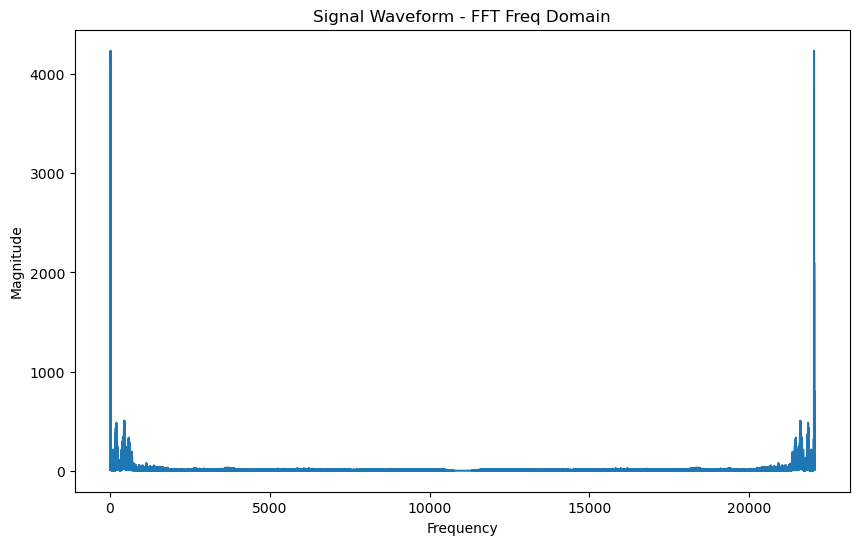

In [12]:
plt.figure(figsize=fig_size)
plt.xlabel("Frequency")
plt.ylabel("Magnitude")
plt.title("Signal Waveform - FFT Freq Domain")

plt.plot(frequency,magnitude)

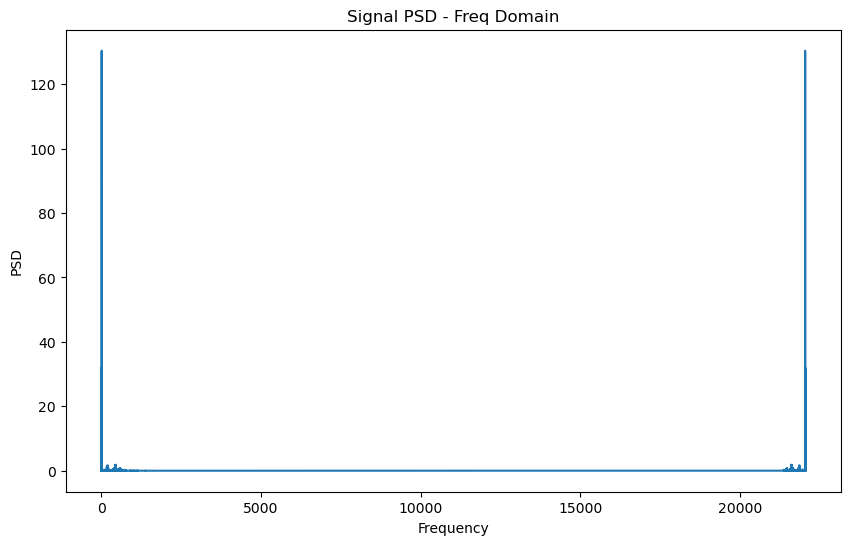

In [13]:
plt.figure(figsize=fig_size)
plt.xlabel("Frequency")
plt.ylabel("PSD")
plt.title("Signal PSD - Freq Domain")

plt.plot(frequency,psd)

## FREQ Filtered

In [14]:
np.percentile(np.real(psd),[0.999])

array([1.95313529e-10])

In [15]:
idx = [(psd < 0.4)]
psd_filtered = psd * idx
filtered_fft = idx * fft

filtered_signal = np.real(np.fft.ifft(filtered_fft))
filtered_signal = filtered_signal.reshape(-1).astype(np.float32)

filt_magnitude = np.abs(filtered_signal)
filt_frequency =np.linspace(0,sample_rate,len(filt_magnitude))

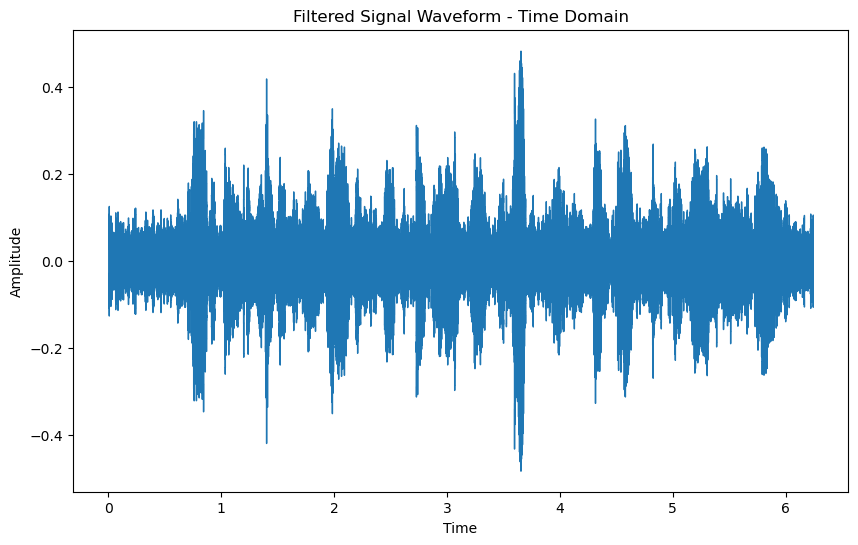

In [16]:
plt.figure(figsize=fig_size)
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.title("Filtered Signal Waveform - Time Domain")

disp.waveshow(filtered_signal,sr=sample_rate)

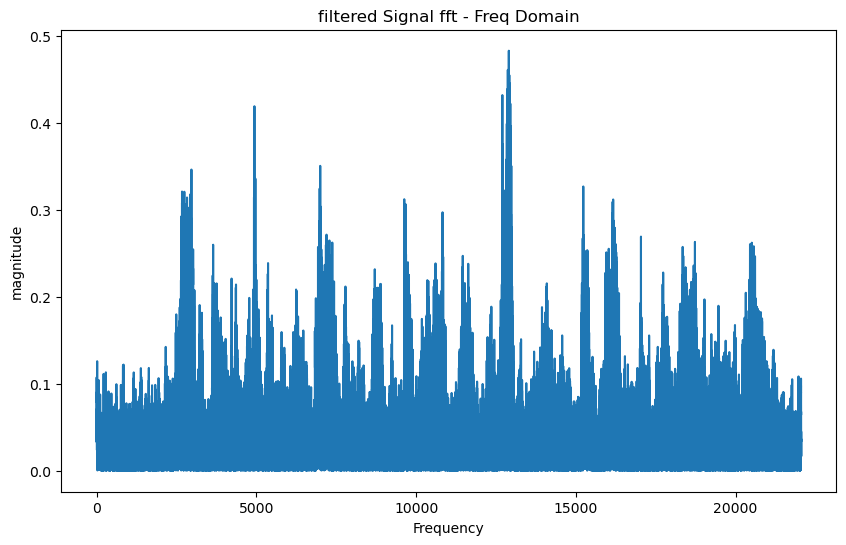

In [17]:
plt.figure(figsize=fig_size)
plt.xlabel("Frequency")
plt.ylabel("magnitude")
plt.title("filtered Signal fft - Freq Domain")

plt.plot(filt_frequency,filt_magnitude)

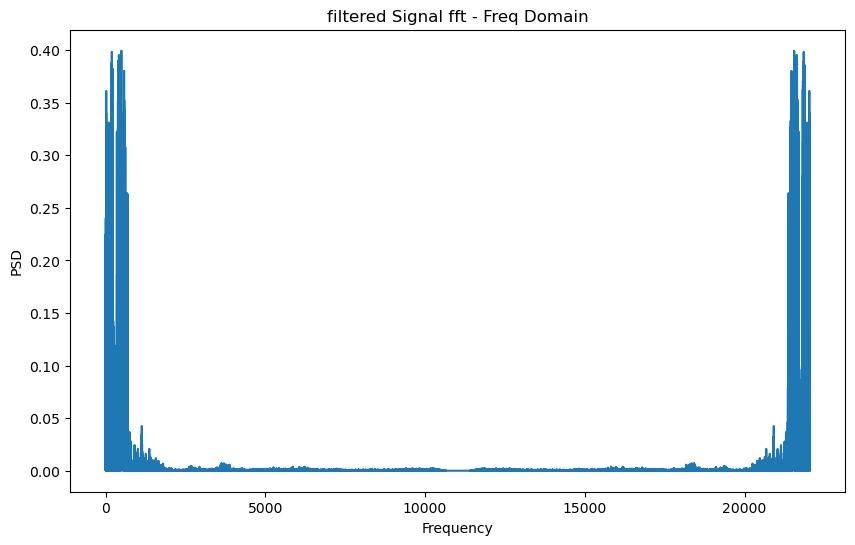

In [18]:
plt.figure(figsize=fig_size)
plt.xlabel("Frequency")
plt.ylabel("PSD")
plt.title("filtered Signal fft - Freq Domain")

plt.plot(filt_frequency,psd_filtered.ravel())

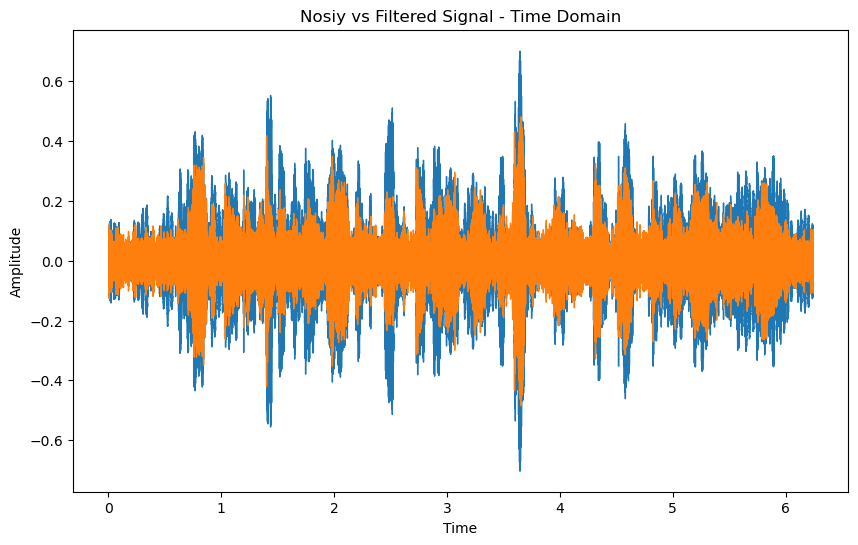

In [19]:
plt.figure(figsize=fig_size)
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.title("Nosiy vs Filtered Signal - Time Domain")
disp.waveshow(signal,sr=sample_rate)
disp.waveshow(filtered_signal,sr=sample_rate)
plt.show()

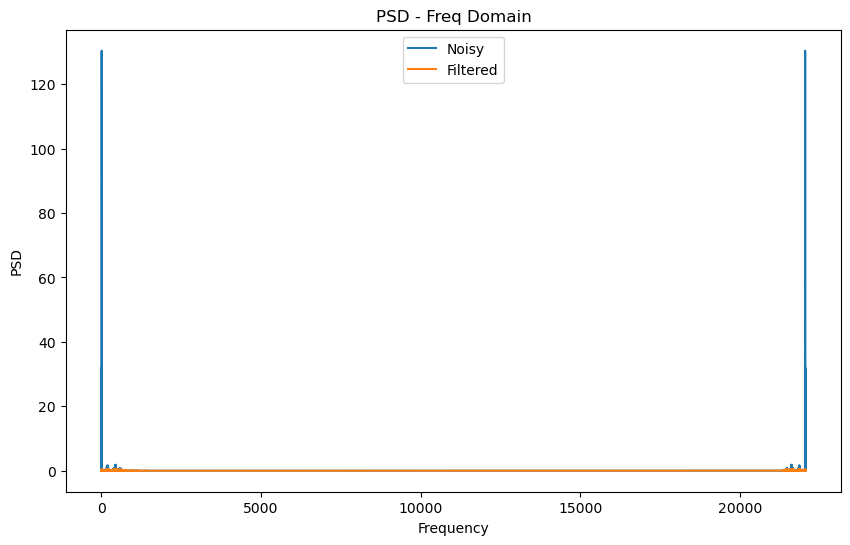

In [20]:
plt.figure(figsize=fig_size)
plt.xlabel("Frequency")
plt.ylabel("PSD")
plt.title("PSD - Freq Domain")
plt.plot(frequency,psd)
plt.plot(frequency,psd_filtered.ravel())
plt.legend(['Noisy','Filtered'])
plt.show()

In [21]:
filtered_sample_path = 'denoised.wav'
wavfile.write(filtered_sample_path, sample_rate, filtered_signal)
Audio(filtered_sample_path)

## Clean Audio

In [22]:
clean_sample_file_path = sample_file_path.replace('noisy','clean')
clean_sample_file_path

'./../data/28/clean_trainset_28spk_wav/p244_016.wav'

In [23]:
clean_signal, sample_rate = libr.load(clean_sample_file_path) #sr=22050
Audio(clean_sample_file_path)

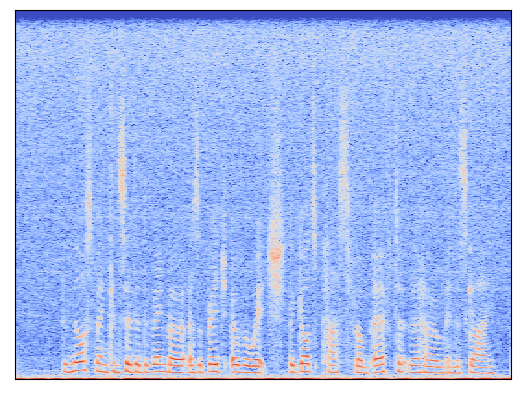

In [24]:
n_fft = 2048
hop_len = 512

stft = libr.core.stft(signal, n_fft=n_fft, hop_length=hop_len)
spectogram = np.abs(stft)
log_spectogram = libr.amplitude_to_db(spectogram)
disp.specshow(log_spectogram,sr=sample_rate,hop_length=hop_len)

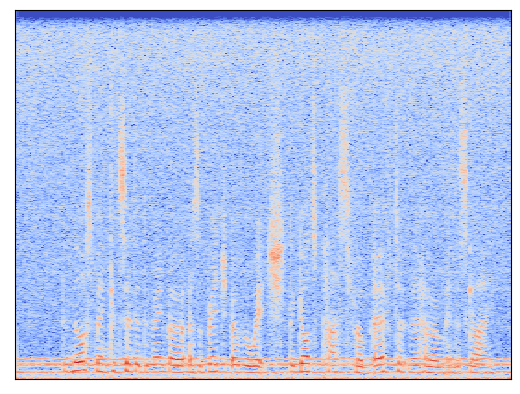

In [25]:
n_fft = 2048
hop_len = 512

filt_stft = libr.core.stft(filtered_signal, n_fft=n_fft, hop_length=hop_len)
filt_spectogram = np.abs(filt_stft)
filt_log_spectogram = libr.amplitude_to_db(filt_spectogram)
disp.specshow(filt_log_spectogram,sr=sample_rate,hop_length=hop_len)

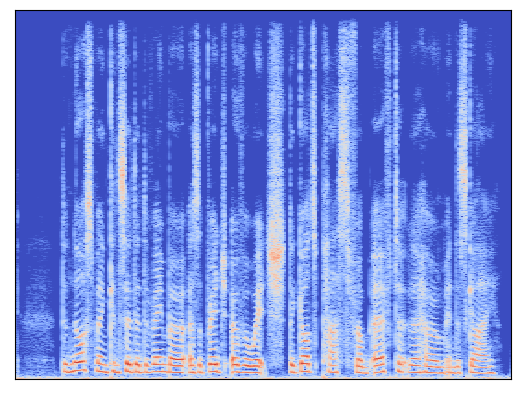

In [26]:
n_fft = 2048
hop_len = 512

clean_stft = libr.core.stft(clean_signal, n_fft=n_fft, hop_length=hop_len)
clean_spectogram = np.abs(clean_stft)
clean_log_spectogram = libr.amplitude_to_db(clean_spectogram)
disp.specshow(clean_log_spectogram,sr=sample_rate,hop_length=hop_len)

In [5]:
def compute_snr(clean_audio, denoised_audio):
    noise_power = np.mean(np.square(clean_audio - denoised_audio))
    signal_power = np.mean(np.square(clean_audio))
    snr = np.round(10 * np.log10(signal_power / noise_power),3)
    return snr

In [8]:
def denoise_audio(path1, path2, t1=0.0,t2=1.0):
    signal, sample_rate = libr.load(str(path1),sr=16000) 
    clean_signal, sample_rate = libr.load(path2,sr=16000)

    fft = np.fft.fft(signal)
    magnitude = np.abs(fft)
    frequency =np.linspace(0,sample_rate,len(magnitude))
    psd = fft * np.conj(fft) /  len(signal)
    
    idx = [(psd >= t1) &  (psd <= t2)]
    psd_filtered = psd * idx
    filtered_fft = idx * fft

    filtered_signal = np.real(np.fft.ifft(filtered_fft))
    filtered_signal = filtered_signal.reshape(-1).astype(np.float32)

    filt_magnitude = np.abs(filtered_signal)
    filt_frequency =np.linspace(0,sample_rate,len(filt_magnitude))
    
    filtered_sample_path = './denoised_fft.wav'
    wavfile.write(filtered_sample_path, sample_rate, filtered_signal)
    
    print("Clean SNR:",compute_snr(clean_signal,signal))
    print("Denoised SNR:",compute_snr(clean_signal,filtered_signal))
    
    print("Noisy PESQ:",pesq(sample_rate, clean_signal, signal, 'wb'))
    print("Denoised PESQ:",pesq(sample_rate, clean_signal, filtered_signal, 'wb'))
    
    return filtered_sample_path

In [9]:
fp1 = './sample_noisy.wav'
fp2 = './sample_clean.wav'

denoise_audio(fp1, fp2)

Clean SNR: 16.755
Denoised SNR: 14.288
Noisy PESQ: 2.3866801261901855
Denoised PESQ: 2.01316499710083


'./denoised_fft.wav'

In [10]:
Audio("./denoised_fft.wav")

In [68]:
sample_file_path =
Audio(sample_file_path)

In [69]:
Audio(denoise_audio(sample_file_path))

Clean SNR: -0.4
Denoised SNR: 9.987
Noisy PESQ: 1.3558499813079834
Denoised PESQ: 1.3286395072937012


In [71]:
Audio(denoise_audio(clean_sample_file_path))

Clean SNR: inf
Denoised SNR: 16.07
Noisy PESQ: 4.643888473510742
Denoised PESQ: 2.1612744331359863


In [31]:
Audio(denoise_audio(sample_file_path, t1=0.1))

Clean SNR: -0.431
Denoised SNR: 4.494


In [32]:
Audio(denoise_audio(sample_file_path, t1=0.0,t2=0.4))

Clean SNR: -0.431
Denoised SNR: 4.222


In [33]:
Audio(denoise_audio(sample_file_path, t1=0.0,t2=0.4))

Clean SNR: -0.431
Denoised SNR: 4.222


In [34]:
Audio(denoise_audio(sample_file_path, t1=0.05))

Clean SNR: -0.431
Denoised SNR: 5.939


In [35]:
Audio(denoise_audio(sample_file_path, t1=0.05, t2 = 0.95))

Clean SNR: -0.431
Denoised SNR: 5.778


In [36]:
Audio(denoise_audio(sample_file_path, t1=0.05, t2 = 0.9))

Clean SNR: -0.431
Denoised SNR: 5.598


In [37]:
Audio(denoise_audio(sample_file_path, t1=0.05, t2 = 0.8))

Clean SNR: -0.431
Denoised SNR: 5.292


In [38]:
Audio(denoise_audio(sample_file_path, t1=0.05, t2 = 0.6))

Clean SNR: -0.431
Denoised SNR: 4.252


In [39]:
Audio(denoise_audio(sample_file_path, t1=0.0, t2 = 0.05))

Clean SNR: -0.431
Denoised SNR: 0.577


In [40]:
Audio(denoise_audio(sample_file_path, t1=0.0, t2 = 0.01))

Clean SNR: -0.431
Denoised SNR: 0.238


In [41]:
Audio(denoise_audio(sample_file_path, t1=0.0, t2 = 0.01))

Clean SNR: -0.431
Denoised SNR: 0.238


In [42]:
Audio(denoise_audio(sample_file_path, t1=0.0, t2 = 0.01))

Clean SNR: -0.431
Denoised SNR: 0.238


In [43]:
def denoise_audio_plot(path):
    signal, sample_rate = libr.load(str(path)) 
    clean_signal, sample_rate = libr.load(str(path).replace('noisy','clean'))

    fft = np.fft.fft(signal)
    magnitude = np.abs(fft)
    frequency =np.linspace(0,sample_rate,len(magnitude))
    psd = fft * np.conj(fft) /  len(signal)
    
    sn_clean = compute_snr(clean_signal,signal)
    snr_vals,t1_vals = [],[]
    for t1 in np.linspace(0.0, 1.0, num=50):
        idx = [(psd >= t1)]
        psd_filtered = psd * idx
        filtered_fft = idx * fft

        filtered_signal = np.real(np.fft.ifft(filtered_fft))
        filtered_signal = filtered_signal.reshape(-1).astype(np.float32)
        snr_filt = compute_snr(clean_signal,filtered_signal)
        snr_vals.append(snr_filt)
        t1_vals.append(t1)
            
    plt.figure(figsize=(5,3))
    plt.scatter(t1_vals, snr_vals, label='t1')
    plt.legend()
    plt.show()
    
    snr_vals,t2_vals = [],[]
    for t2 in np.linspace(0.0, 1.0, num=50):
        idx = [(psd <= t2)]
        psd_filtered = psd * idx
        filtered_fft = idx * fft

        filtered_signal = np.real(np.fft.ifft(filtered_fft))
        filtered_signal = filtered_signal.reshape(-1).astype(np.float32)
        snr_filt = compute_snr(clean_signal,filtered_signal)
        snr_vals.append(snr_filt)
        t2_vals.append(t2)
            
    plt.figure(figsize=(5,3))
    plt.scatter(t2_vals, snr_vals, label='t2')
    plt.legend()
    plt.show()


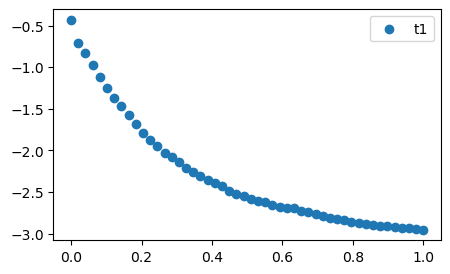

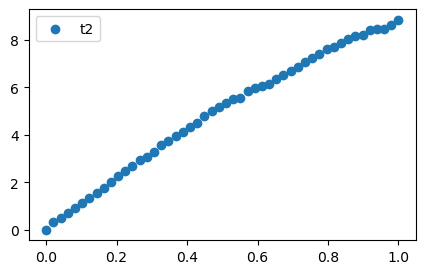

In [44]:
denoise_audio_plot(sample_file_path)